# Exploratory Data Analysis(EDA)
Here we aim to look for missing values, identify outliers, check distributions, inspect correlations, spot strane patterns in our data and understand relationships between features.

In [13]:
# importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

In [14]:
# Set style
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 8)

In [15]:
# Load the dataset
df = pd.read_csv("C:/Users/Dell/Machine_Learning/Insulin_system/Diabetes_dataset/SmartSensor_DiabetesMonitoring.csv")

In [16]:
#display
df.head()

,Patient_ID,Timestamp,Glucose_Level,Heart_Rate,Activity_Level,Calories_Burned,Sleep_Duration,Step_Count,Insulin_Dose,Medication_Intake,Diet_Quality_Score,Stress_Level,BMI,HbA1c,Blood_Pressure_Systolic,Blood_Pressure_Diastolic,Predicted_Progression
0,P052,2025-06-01 00:00:00,165.7,67.0,68,193.1,4.4,8832,8,1,8,4,26.2,5.5,109,68,1
1,P093,2025-06-01 00:15:00,114.0,70.0,38,205.9,4.3,2255,0,0,5,9,24.5,6.2,152,79,1
2,P015,2025-06-01 00:30:00,125.2,81.0,69,274.5,6.1,1299,4,1,8,9,26.0,5.5,143,99,2
3,P072,2025-06-01 00:45:00,157.1,82.0,99,141.9,4.2,8809,10,1,4,9,22.1,6.8,112,60,0
4,P061,2025-06-01 01:00:00,156.8,62.0,3,245.7,7.7,5521,10,0,10,3,21.4,7.7,152,72,1


=== MISSING VALUES ===
                          Missing Count  Percentage             Status
Patient_ID                            0         0.0  No missing values
Timestamp                             0         0.0  No missing values
Glucose_Level                         0         0.0  No missing values
Heart_Rate                            0         0.0  No missing values
Activity_Level                        0         0.0  No missing values
Calories_Burned                       0         0.0  No missing values
Sleep_Duration                        0         0.0  No missing values
Step_Count                            0         0.0  No missing values
Insulin_Dose                          0         0.0  No missing values
Medication_Intake                     0         0.0  No missing values
Diet_Quality_Score                    0         0.0  No missing values
Stress_Level                          0         0.0  No missing values
BMI                                   0         0.0  N

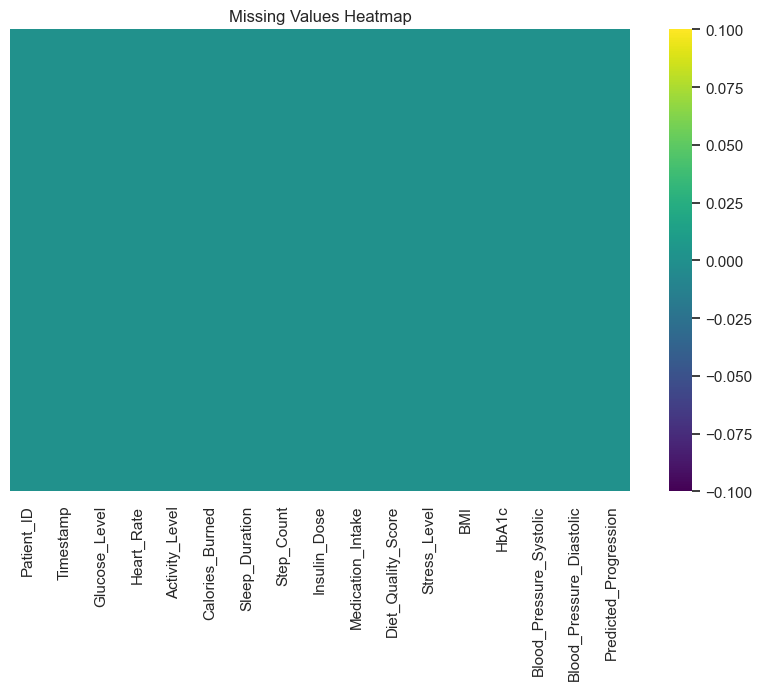

In [17]:
# check for missing values
print("=== MISSING VALUES ===")
missing = df.isnull().sum()
missing_percentage = (missing / len(df)) * 100

# Build the missing-value table
missing_df = pd.DataFrame({
    'Missing Count': missing,
    'Percentage': missing_percentage
})

# status label incase there are no missing values
missing_df['Status'] = missing_df['Missing Count'].apply(
    lambda x: 'No missing values' if x == 0 else f'{x} missing'
)

print(missing_df)

# Visualize missing data
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=True, yticklabels=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()


=== OUTLIERS (IQR Method) ===
Glucose_Level: 37 outliers
Heart_Rate: 21 outliers
Calories_Burned: 33 outliers
BMI: 38 outliers
HbA1c: 24 outliers


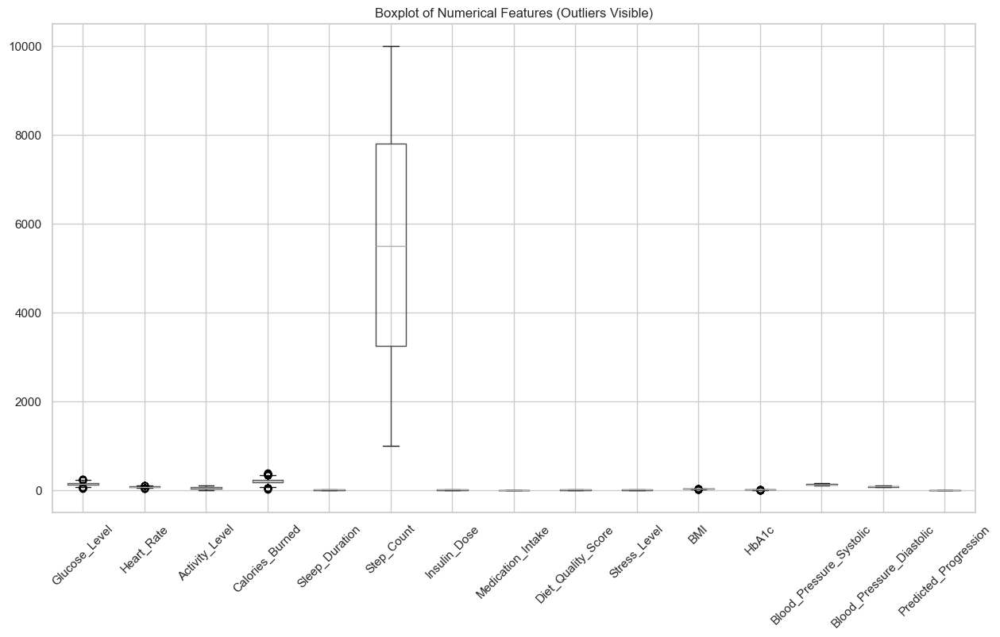

In [18]:
# checking for outliers
numerical_cols = df.select_dtypes(include=[np.number]).columns

def detect_outliers_iqr(data, col):
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    return data[(data[col] < lower) | (data[col] > upper)].index

def detect_outliers_zscore(data, col, threshold=3):
    z = np.abs(stats.zscore(data[col].dropna()))
    return data[col].dropna().index[z > threshold]

print("\n=== OUTLIERS (IQR Method) ===")
outlier_indices = {}
for col in numerical_cols:
    outliers = detect_outliers_iqr(df, col)
    if len(outliers) > 0:
        print(f"{col}: {len(outliers)} outliers")
        outlier_indices[col] = outliers

# Box plots
plt.figure(figsize=(15, 8))
df[numerical_cols].boxplot()
plt.title('Boxplot of Numerical Features (Outliers Visible)')
plt.xticks(rotation=45)
plt.show()


=== DISTRIBUTION ANALYSIS ===


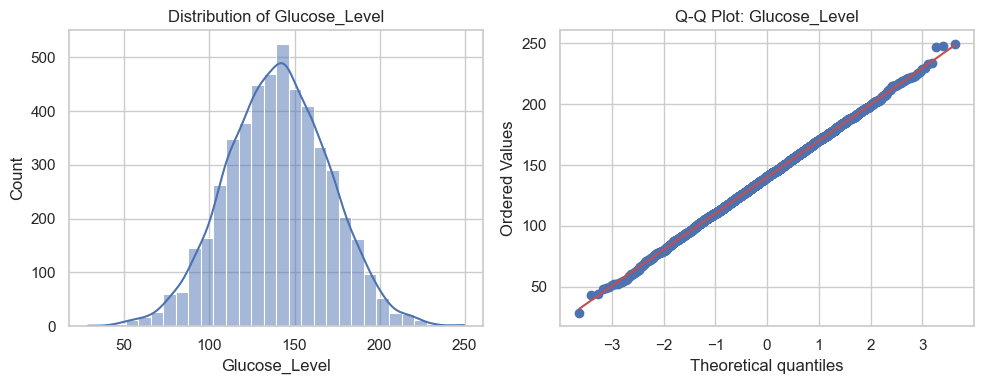

Glucose_Level - Skewness: -0.01, Kurtosis: -0.00


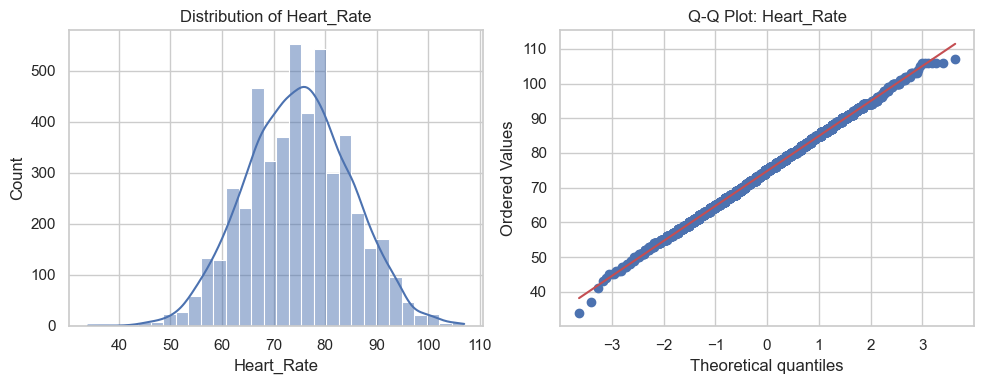

Heart_Rate - Skewness: -0.00, Kurtosis: -0.10


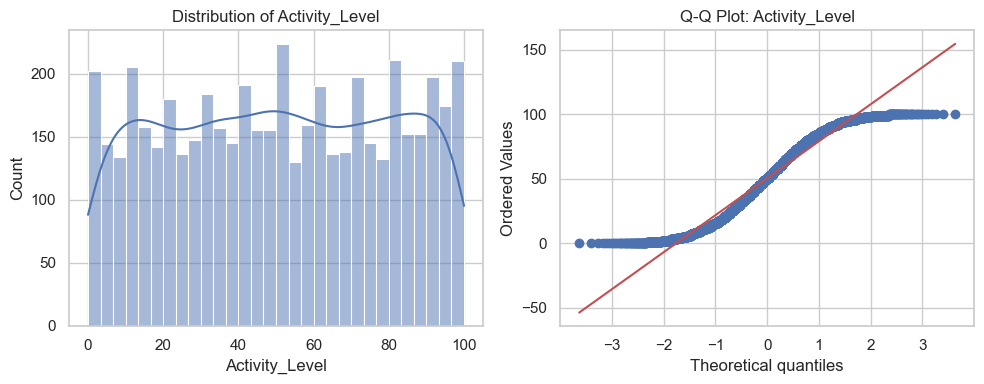

Activity_Level - Skewness: -0.01, Kurtosis: -1.20


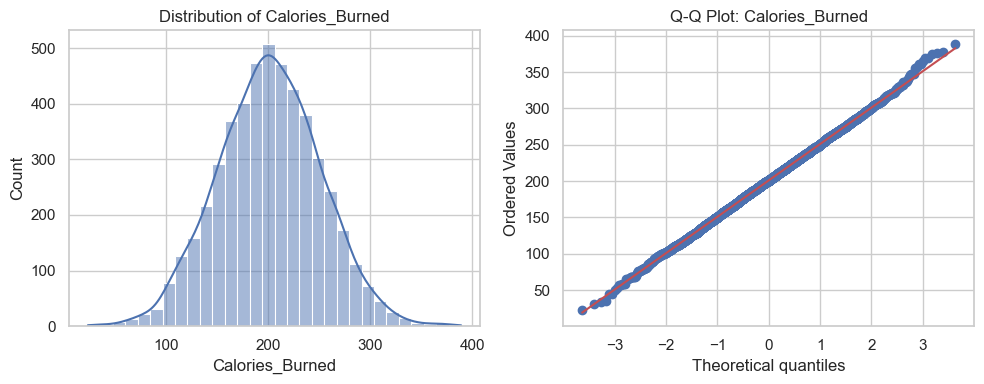

Calories_Burned - Skewness: 0.02, Kurtosis: 0.04


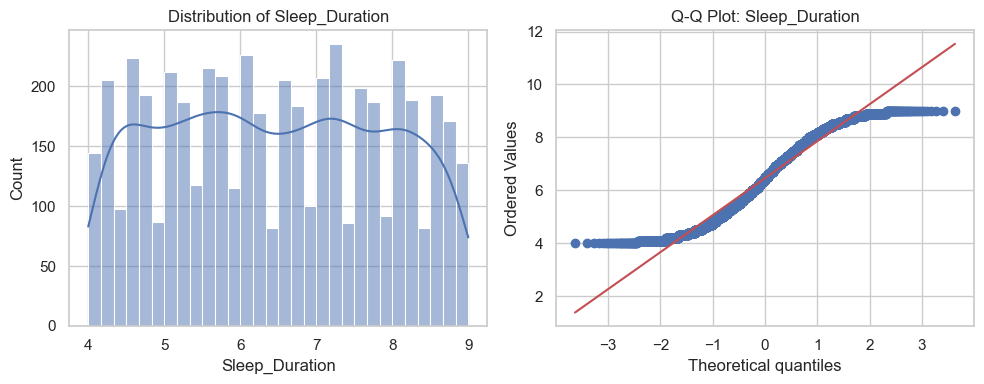

Sleep_Duration - Skewness: 0.03, Kurtosis: -1.18


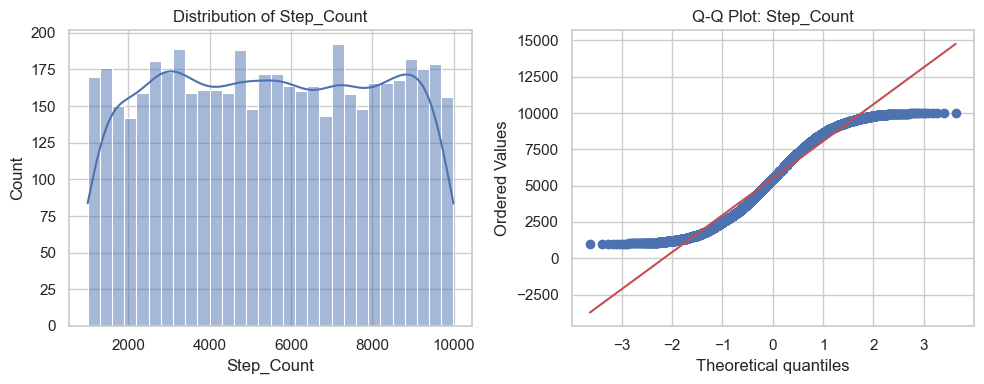

Step_Count - Skewness: -0.00, Kurtosis: -1.21


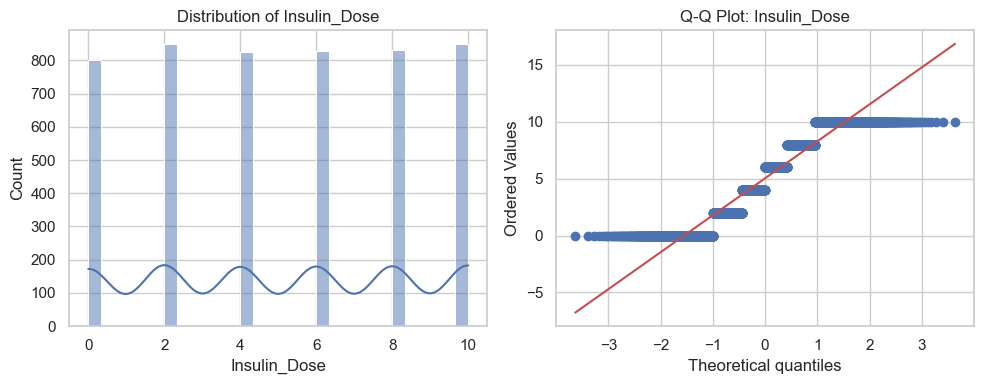

Insulin_Dose - Skewness: -0.01, Kurtosis: -1.27


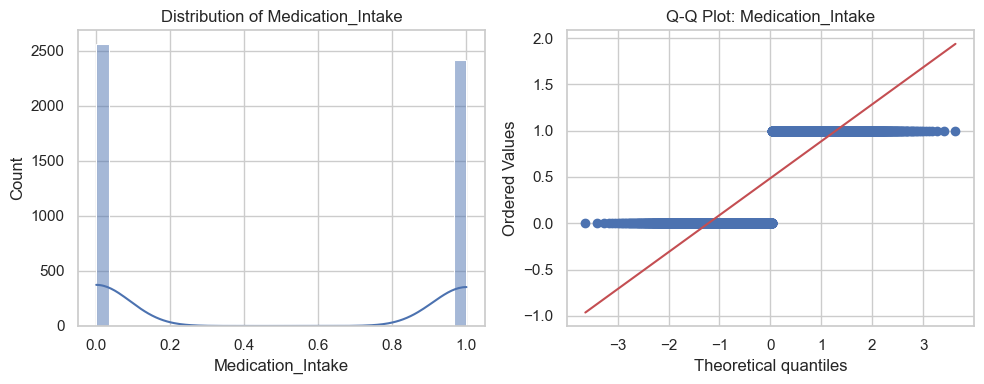

Medication_Intake - Skewness: 0.06, Kurtosis: -2.00


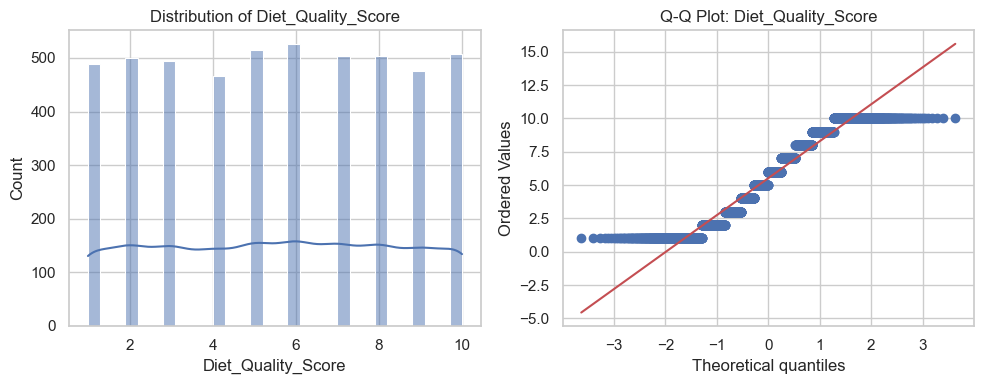

Diet_Quality_Score - Skewness: -0.01, Kurtosis: -1.21


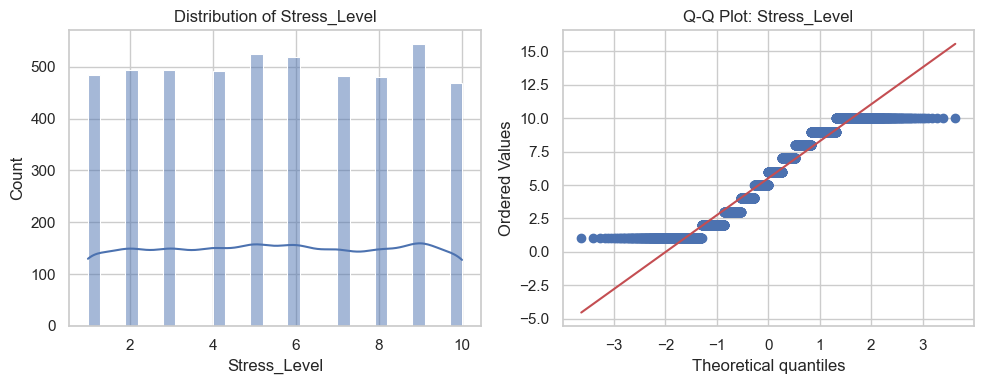

Stress_Level - Skewness: -0.01, Kurtosis: -1.21


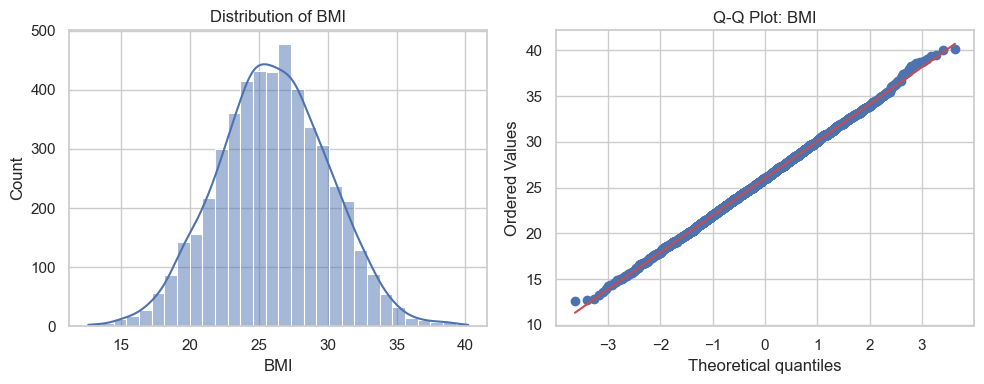

BMI - Skewness: 0.02, Kurtosis: -0.01


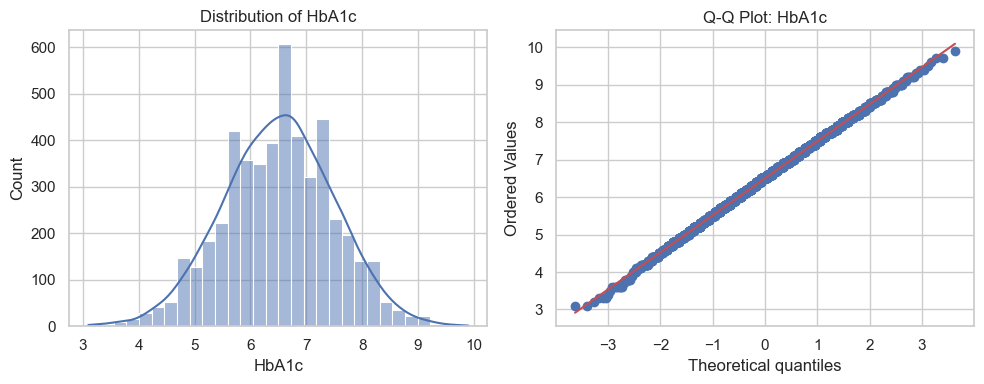

HbA1c - Skewness: -0.06, Kurtosis: -0.02


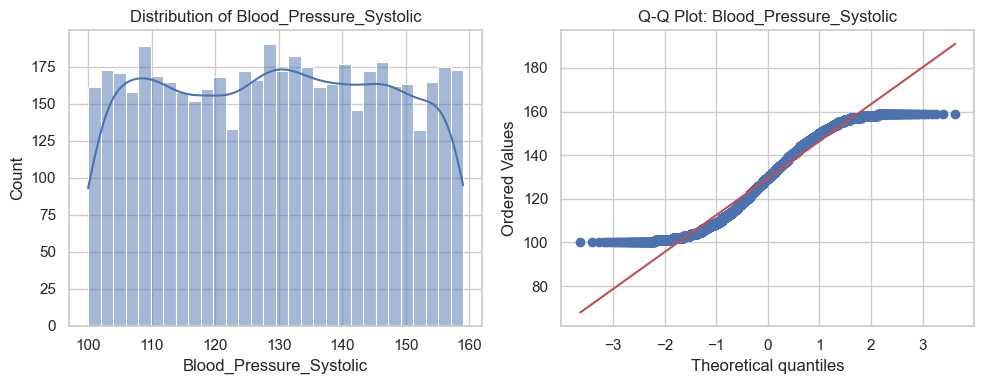

Blood_Pressure_Systolic - Skewness: 0.00, Kurtosis: -1.19


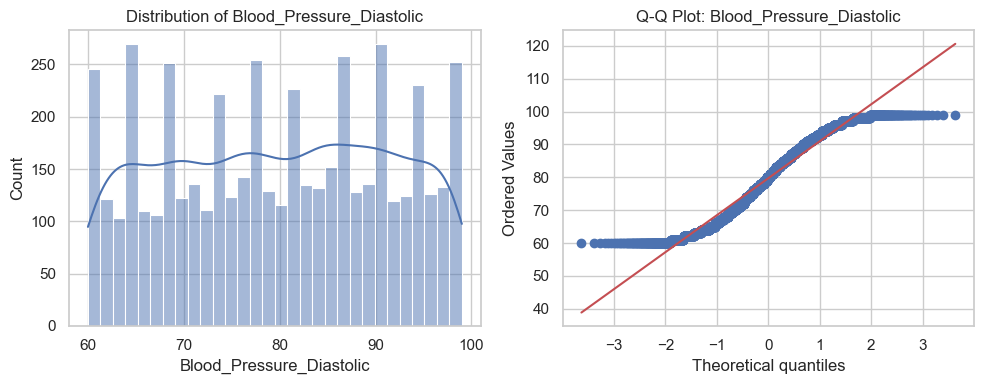

Blood_Pressure_Diastolic - Skewness: -0.04, Kurtosis: -1.18


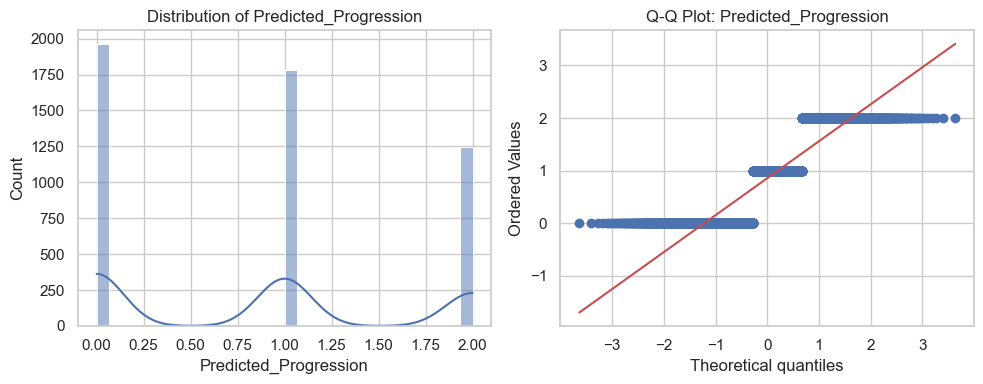

Predicted_Progression - Skewness: 0.26, Kurtosis: -1.35


In [19]:
# distribution analysis for the data
print("\n=== DISTRIBUTION ANALYSIS ===")
for col in numerical_cols:
    plt.figure(figsize=(10, 4))
    
    plt.subplot(1, 2, 1)
    sns.histplot(df[col].dropna(), kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    
    plt.subplot(1, 2, 2)
    stats.probplot(df[col].dropna(), dist="norm", plot=plt)
    plt.title(f'Q-Q Plot: {col}')
    
    plt.tight_layout()
    plt.show()
    
    # Skewness & Kurtosis
    print(f"{col} - Skewness: {df[col].skew():.2f}, Kurtosis: {df[col].kurt():.2f}")


=== CORRELATION MATRIX ===


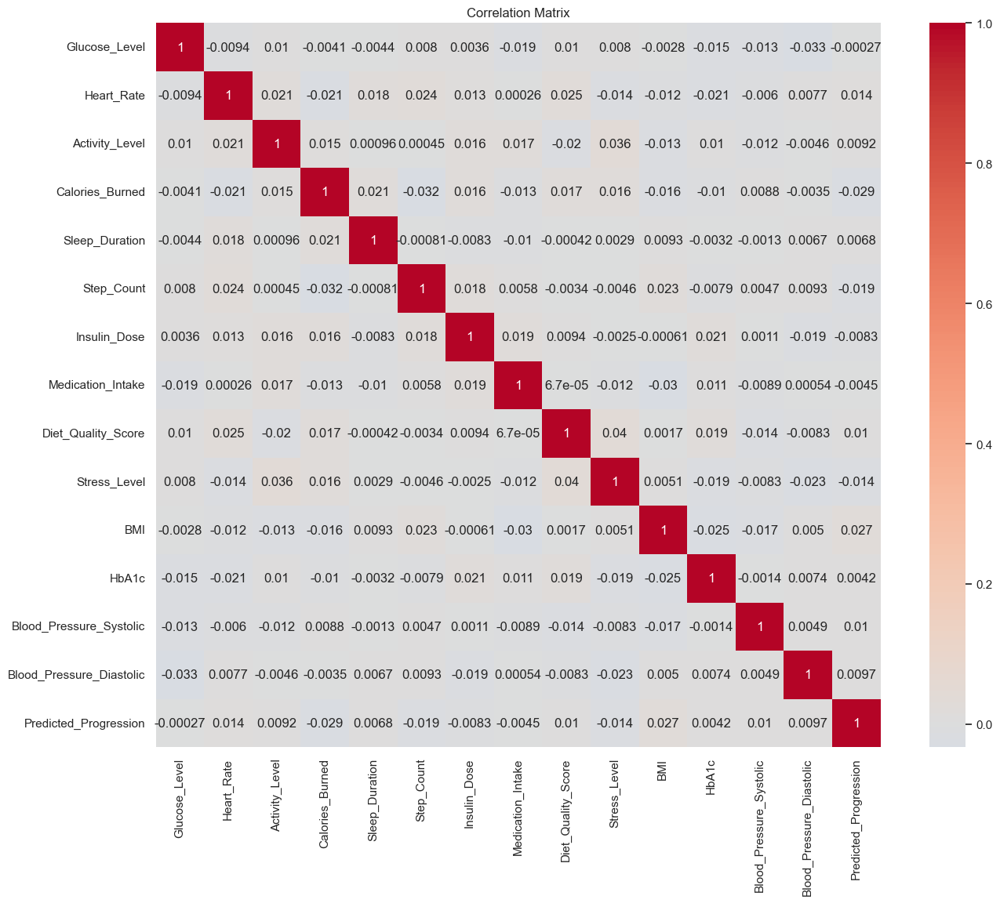

Strong positive correlations (>0.7):
Series([], dtype: float64)


In [20]:
#correlation analysis
print("\n=== CORRELATION MATRIX ===")
corr = df[numerical_cols].corr()

plt.figure(figsize=(16, 12))
sns.heatmap(corr, annot=True, cmap='coolwarm', center=0, square=True)
plt.title('Correlation Matrix')
plt.show()

# High correlations
high_corr = corr[(corr > 0.7) & (corr != 1.0)]
print("Strong positive correlations (>0.7):")
print(high_corr.stack())

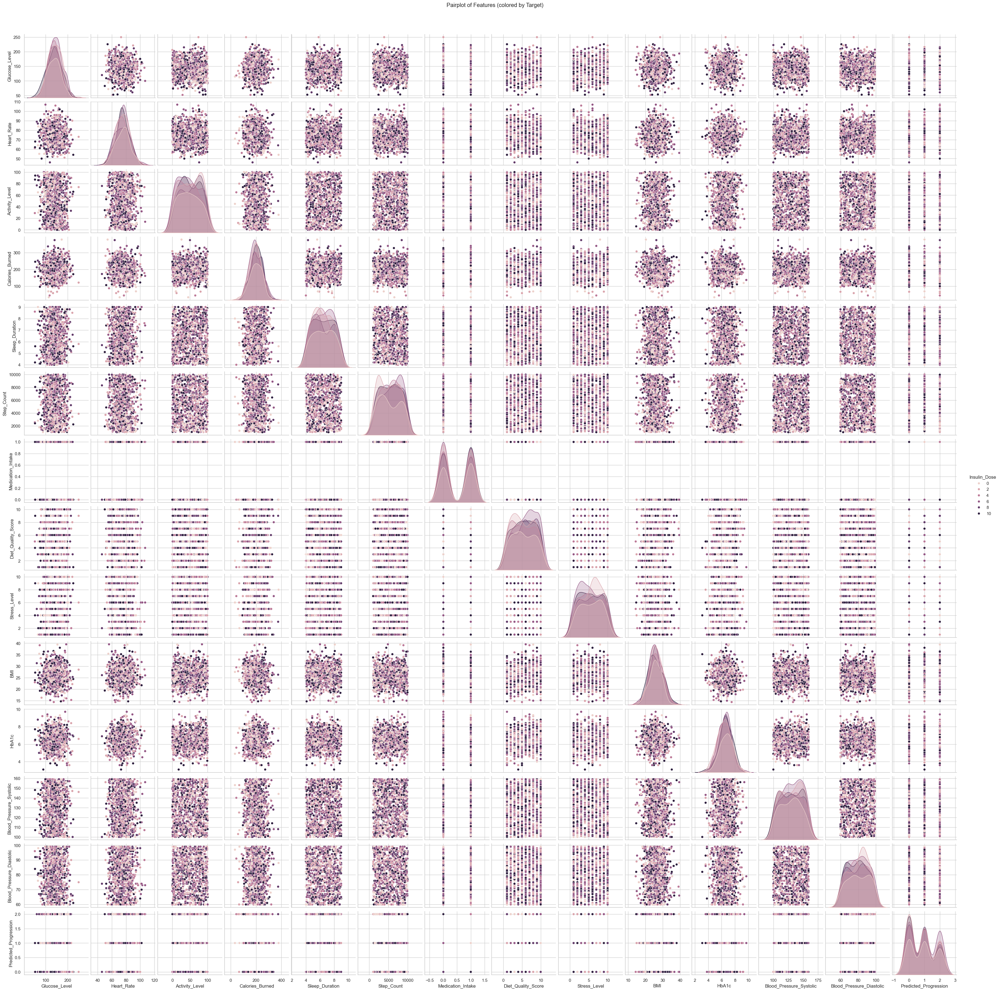

In [21]:
# Sample if dataset is large
sample_df = df.sample(min(1000, len(df)), random_state=42)

sns.pairplot(sample_df, hue='Insulin_Dose', diag_kind='kde')
plt.suptitle('Pairplot of Features (colored by Target)', y=1.02)
plt.show()

In [23]:
#identifying strange patterns
print("\n=== STRANGE PATTERNS CHECK ===")

# 1. Duplicate rows
duplicates = df.duplicated().sum()
print(f"Duplicate rows: {duplicates}")

# 2. Constant columns
constant_cols = [col for col in df.columns if df[col].nunique() == 1]
print(f"Constant columns: {constant_cols}")




=== STRANGE PATTERNS CHECK ===
Duplicate rows: 0
Constant columns: []


In [25]:
print("\n" + "="*50)
print("EDA SUMMARY")
print("="*50)
print(f"Shape: {df.shape}")
print("="*50)
print(f"Dataset Information:\n")
df.info()
print("="*50)
print(f"Missing values: {df.isnull().sum().sum()} total")
print("="*50)
print(f"Duplicates: {df.duplicated().sum()}")
print("="*50)
print(f"Numerical features: {len(numerical_cols)}")



EDA SUMMARY
Shape: (4981, 17)
Dataset Information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4981 entries, 0 to 4980
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Patient_ID                4981 non-null   object 
 1   Timestamp                 4981 non-null   object 
 2   Glucose_Level             4981 non-null   float64
 3   Heart_Rate                4981 non-null   float64
 4   Activity_Level            4981 non-null   int64  
 5   Calories_Burned           4981 non-null   float64
 6   Sleep_Duration            4981 non-null   float64
 7   Step_Count                4981 non-null   int64  
 8   Insulin_Dose              4981 non-null   int64  
 9   Medication_Intake         4981 non-null   int64  
 10  Diet_Quality_Score        4981 non-null   int64  
 11  Stress_Level              4981 non-null   int64  
 12  BMI                       4981 non-null   float64
 13  HbA1c     